# Make an inventory of downloaded data
- Spatial Extent
- Temporal Extent
- type of data

In [1]:
%matplotlib inline

In [2]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (12, 7), 'font.size': 10})

import hvplot
import hvplot.pandas
import geoviews as gv

import warnings  # March 30, 2022  
warnings.filterwarnings(action="ignore", category=FutureWarning)  #, message="pandas.Int64Index"


In [3]:
root_folder = '/fs/project/howat.4/icesat2'
dem_type = 'EarthDEM' # greenland antarctica
short_name = 'ATL08'
base_folder = f'/fs/project/howat.4/icesat2/{dem_type}'
os.path.exists(base_folder)

True

In [4]:
# regions = [f for f in os.listdir(f'/fs/project/howat.4/icesat2/antarctica_ATL06') if f.startswith('rema_')]
# regions = [f for f in os.listdir(f'/fs/project/howat.4/icesat2/REMA') if f.startswith('rema_')]
regions = [f for f in os.listdir(base_folder) if f.endswith(short_name)]

print(regions)

['region_31_alaska_south_ATL08', 'region_34_alaska_north_ATL08']


In [5]:
# os.listdir(f'/fs/project/howat.4/icesat2/REMA/{regions[0]}')

In [7]:
# PartI : create and save convex hall shapefile and png for coverage of each region (time consuming to run)

for region in regions:
    print(region)
    # icesat2_path = f'/fs/project/howat.4/icesat2/antarctica_{short_name}/{region}'
    # icesat2_path = f'/fs/project/howat.4/icesat2/REMA/{region}'
    base_icesat2_path = f'{base_folder}/{region}'
    strips = os.listdir(base_icesat2_path)
    for strip in strips[10:15]:
        icesat2_path = f'{base_icesat2_path}/{strip}'
        # icesat2_path = f'{}/EarthDEM/{region}'
        files = os.listdir(f'{icesat2_path}')
        outline = gpd.read_file(f'{icesat2_path}/strip_outline.shp')
        shp_ext = 'shp' #'shp' 'gpkg'
        shp_files = [f for f in files if f.endswith(f'.{shp_ext}') and short_name in f]
        if len(shp_files)>0:
            # dict and list to temporarily hold data for geodataframe creation
            shp_dict = {}
            flist = []
            chlist = []
            pt_count = []
            for shp in shp_files:
                fname = shp.split('.shp')[0]
                gdf = gpd.read_file(f'{icesat2_path}/{fname}.{shp_ext}', parse_dates=True)
                #if len(gdf)<=1:
                #    continue
                ch = gdf.geometry.unary_union.convex_hull
                ch = gpd.GeoSeries(ch, crs=outline.crs)
                ch = list(ch.geometry)[0]
                flist.append(fname)
                chlist.append(ch)
                pt_count.append(len(gdf))
            shp_dict['name'] = flist
            shp_dict['pt_count'] = pt_count

            shp_dict['geometry'] = chlist
            df = pd.DataFrame.from_dict(shp_dict)
            gdf1 = gpd.GeoDataFrame(df, geometry='geometry', crs=outline.crs)
            # Add more attributes
            gdf1['date'] = gdf1.name.apply(lambda x: x.split('_')[2][:8]) #pd.to_datetime() but datetime field can't be saved to esri file; DriverSupportError: ESRI Shapefile does not support datetime fields
            gdf1 = gdf1[gdf1.geom_type=='Polygon'] #Remove mixed geometry such as LineString or Point; else error in saving to shapefile
            metadata_folder = f'{root_folder}/prototyping/metadata/{region}'
            os.makedirs(f'{metadata_folder}', exist_ok=True)
            gdf1.to_file(f'{metadata_folder}/{strip}.gpkg')

            ax = outline.plot(alpha=.2, figsize=(12, 12))
            gdf1.plot(ax=ax, color='r', alpha=.4)
            plt.title(region)
            plt.savefig(f'{metadata_folder}/{strip}.png')
            plt.close(plt.gcf())
        else:
            print(f'Missing shapefiles: {region}')

region_31_alaska_south_ATL08
region_34_alaska_north_ATL08
Missing shapefiles: region_34_alaska_north_ATL08


In [ ]:
# Merge region-wise shapefiles into 1
# region = regions[0]
gdf = gpd.read_file(f'{metadata_folder}/{strip}.shp')
gdf['region'] = region
for region in regions[1:]:
    print(region)
    #shp = f'/fs/project/howat.4/icesat2/prototyping/metadata/{region}.shp'
    tmp = gpd.read_file(f'/fs/project/howat.4/icesat2/antarctica_ATL06/metadata/{region}.shp')
    tmp['region'] = region
    gdf = pd.concat([gdf, tmp])
# Save the merged product
# Convert Polar Stereographic projection south
gdf = gdf.to_crs('EPSG:3412')
gdf.to_file(f'/fs/project/howat.4/icesat2/antarctica_ATL06/metadata/regions.shp')

In [6]:
gdf = gpd.read_file(f'/fs/project/howat.4/icesat2/REMA/metadata/regions.shp')
gdf.head()

In [4]:
gdf = gpd.read_file(f'/fs/project/howat.4/icesat2/antarctica_ATL06/metadata/regions.shp')
gdf.head()

,name,pt_count,date,region,geometry
0,processed_ATL06_20181202132019_09910112_003_01,206551,20181202,rema_07_qml_ne,"POLYGON ((169413.685 1512583.789, 169313.010 1..."
1,processed_ATL06_20181201121141_09750112_003_01,3444,20181201,rema_07_qml_ne,"POLYGON ((787390.986 2039517.956, 787462.956 2..."
2,processed_ATL06_20181201134558_09760112_003_01,201357,20181201,rema_07_qml_ne,"POLYGON ((18184.959 1521217.286, 18082.950 152..."
3,processed_ATL06_20181202145437_09920112_003_01,10383,20181202,rema_07_qml_ne,"POLYGON ((-455583.346 1448721.772, -455683.609..."
4,processed_ATL06_20181203125440_10060112_003_01,211885,20181203,rema_07_qml_ne,"POLYGON ((312481.457 1488242.051, 312379.934 1..."


In [5]:
gdf['date'] = gdf.date.apply(lambda x: pd.to_datetime(x))
gdf.date.min(), gdf.date.max(), gdf.date.max() - gdf.date.min()

(Timestamp('2018-12-01 00:00:00'),
 Timestamp('2019-02-28 00:00:00'),
 Timedelta('89 days 00:00:00'))

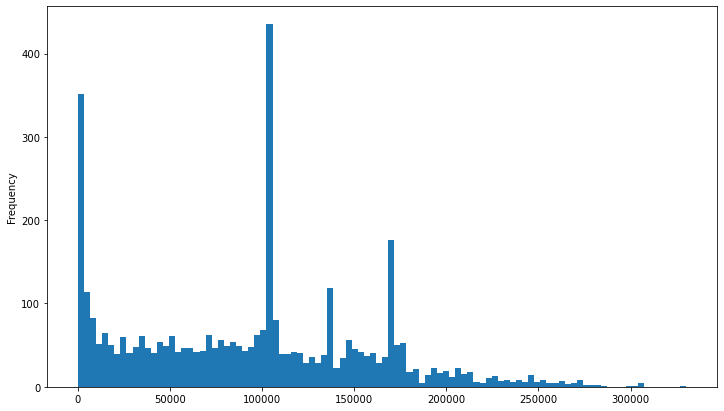

In [6]:
gdf.pt_count.plot(kind='hist', bins=100);

In [7]:
tmp.head()

NameError: name 'tmp' is not defined

In [22]:
tmp.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [6]:
len(gdf)

3841

In [7]:
gdf.head()

,name,pt_count,date,region,geometry
0,processed_ATL06_20181202132019_09910112_003_01,206551,2018-12-02,rema_07_qml_ne,"POLYGON ((169413.685 1512583.789, 169313.010 1..."
1,processed_ATL06_20181201121141_09750112_003_01,3444,2018-12-01,rema_07_qml_ne,"POLYGON ((787390.986 2039517.956, 787462.956 2..."
2,processed_ATL06_20181201134558_09760112_003_01,201357,2018-12-01,rema_07_qml_ne,"POLYGON ((18184.959 1521217.286, 18082.950 152..."
3,processed_ATL06_20181202145437_09920112_003_01,10383,2018-12-02,rema_07_qml_ne,"POLYGON ((-455583.346 1448721.772, -455683.609..."
4,processed_ATL06_20181203125440_10060112_003_01,211885,2018-12-03,rema_07_qml_ne,"POLYGON ((312481.457 1488242.051, 312379.934 1..."


In [9]:
gdf.crs

<Projected CRS: EPSG:3412>
Name: NSIDC Sea Ice Polar Stereographic South
Axis Info [cartesian]:
- X[north]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - S hemisphere - south of 60°S
- bounds: (-180.0, -90.0, 180.0, -60.0)
Coordinate Operation:
- name: US NSIDC Sea Ice polar stereographic south
- method: Polar Stereographic (variant B)
Datum: Not specified (based on Hughes 1980 ellipsoid)
- Ellipsoid: Hughes 1980
- Prime Meridian: Greenwich

In [10]:
gdf.head()

,name,pt_count,date,region,geometry
0,processed_ATL06_20181202132019_09910112_003_01,206551,2018-12-02,rema_07_qml_ne,"POLYGON ((169413.685 1512583.789, 169313.010 1..."
1,processed_ATL06_20181201121141_09750112_003_01,3444,2018-12-01,rema_07_qml_ne,"POLYGON ((787390.986 2039517.956, 787462.956 2..."
2,processed_ATL06_20181201134558_09760112_003_01,201357,2018-12-01,rema_07_qml_ne,"POLYGON ((18184.959 1521217.286, 18082.950 152..."
3,processed_ATL06_20181202145437_09920112_003_01,10383,2018-12-02,rema_07_qml_ne,"POLYGON ((-455583.346 1448721.772, -455683.609..."
4,processed_ATL06_20181203125440_10060112_003_01,211885,2018-12-03,rema_07_qml_ne,"POLYGON ((312481.457 1488242.051, 312379.934 1..."


In [11]:
gdf['mon'] = gdf.date.apply(lambda x: x.month)

In [12]:
gdf['region'] = gdf.region.apply(lambda x: x[5:7])

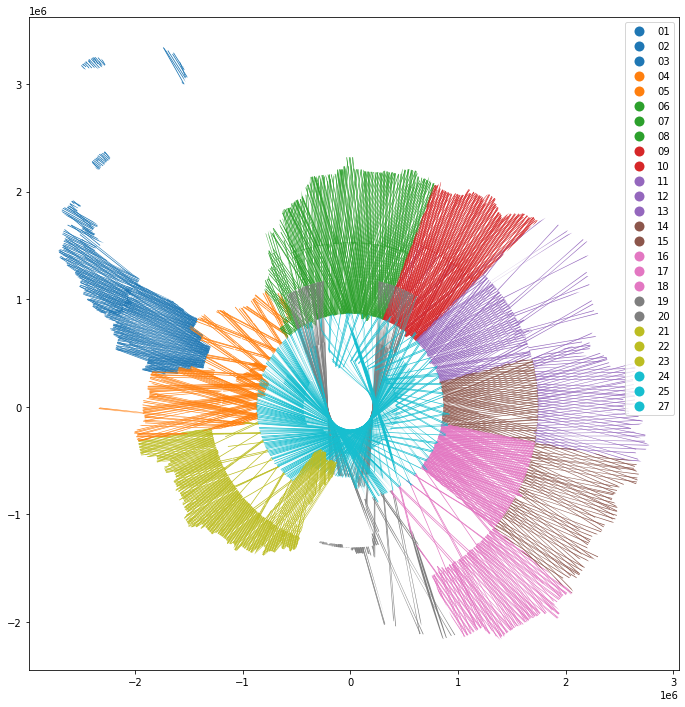

In [13]:
gdf.plot(column='region', figsize=(12, 12), legend=True, categorical=True);

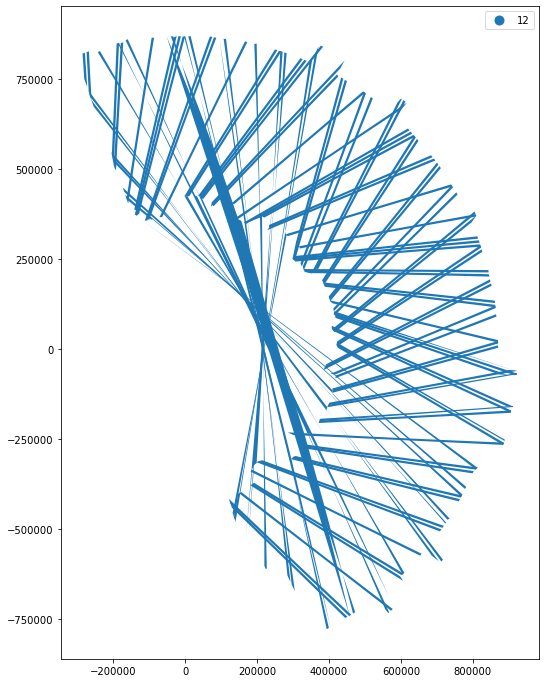

In [14]:
gdf[gdf.region.isin(['27'])].plot(column='mon', figsize=(12, 12), legend=True, categorical=True);

<AxesSubplot:>

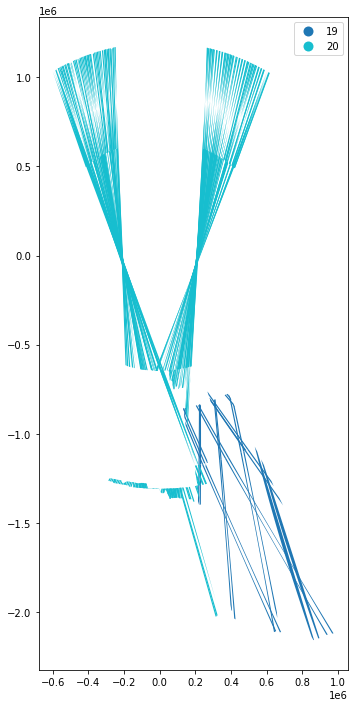

In [15]:
gdf[gdf.region.isin(['19', '20'])].plot(column='region', figsize=(12, 12), legend=True, categorical=True)

<AxesSubplot:>

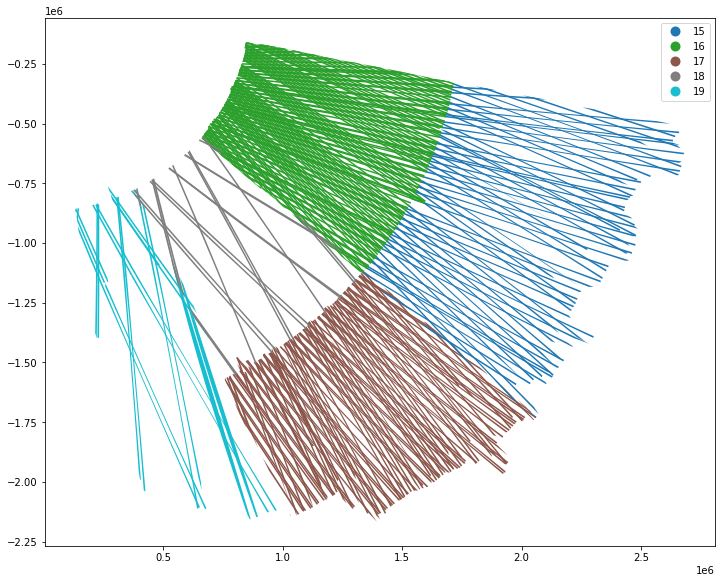

In [16]:
gdf[gdf.region.isin(['15', '16', '17', '18', '19'])].plot(column='region', figsize=(12, 12), legend=True, categorical=True)

In [17]:
# !ls /fs/project/howat.4/icesat2/antarctica_ATL06/metadata|grep .shp
# !ls -ltrh /fs/project/howat.4/icesat2/antarctica_ATL06/rema_08_qml_se/

In [20]:
rema_13_wilkes_land_ne
rema_17_wilkes_land_nw
rema_02_peninsula_north

rema_02_peninsula_north
rema_03_peninsula_south
rema_04_ronne_shelf
rema_05_ellsworth_land
    Missing shapefiles: rema_05_ellsworth_land
rema_06_luitpold_coast
rema_15_wilkes_land_nc
rema_10_qml_sw
rema_12_american_highland
rema_14_wilkes_land_se
rema_16_wilkes_land_sc
rema_19_victoria_land
    Missing shapefiles: rema_19_victoria_land
rema_18_wilkes_land_sw
    Missing shapefiles: rema_18_wilkes_land_sw
rema_01_subantarctic_islands


rema_23_siple_coast
    Missing shapefiles: rema_23_siple_coast
rema_27_qml_south
rema_24_ctam
rema_25_mbl_south
rema_21_mbl_north
rema_22_mbl_central
    Missing shapefiles: rema_22_mbl_central
rema_20_ross_shelf

In [14]:
gdf1[gdf1.pt_count<10]

,name,pt_count,geometry,date
48,processed_ATL06_20190108033456_01630210_003_01,1,POINT (-66.98367 -65.85802),20190108


In [16]:
gdf = gpd.read_file(f'{icesat2_path}/processed_ATL06_20190108033456_01630210_003_01.{shp_ext}', parse_dates=True)

In [17]:
gdf

,t_dt,h_li,q_flag,strip,geometry
0,2019-01-08 03:39:44.462000,198.797165,1,gt2l,POINT (-66.98367 -65.85802)


In [15]:
region

'rema_20_ross_shelf'

In [19]:
# Convert to lat/lon for interactive visualization
gdf_ll = gdf.to_crs('epsg:4326')

In [23]:
gdf_ll.region.value_counts()

08    386
16    310
21    309
10    260
05    231
20    212
07    196
25    185
12    168
03    155
14    151
09    137
04    126
23    124
17    118
02    112
27    103
06     97
24     95
15     76
13     69
22     54
11     51
01     50
18     34
19     32
Name: region, dtype: int64

In [28]:
gdf_ll[gdf_ll.region=='08'].geometry.bounding_box

AttributeError: 'GeoSeries' object has no attribute 'bounding_box'

In [24]:
base = gv.tile_sources.ESRI
base * gdf_ll[gdf_ll.region=='08'].hvplot(geo=True, alpha=0.7, width=800, height=500) #color='strip', 


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

In [13]:
base = gv.tile_sources.ESRI
fig = base * outline.hvplot(geo=True, alpha=.2) * gdf1.hvplot(geo=True, alpha=0.7, width=800, height=500) #color='strip', 
fig

:Overlay
   .WMTS.I      :WMTS   [Longitude,Latitude]
   .Polygons.I  :Polygons   [Longitude,Latitude]
   .Polygons.II :Polygons   [Longitude,Latitude]

In [14]:
# Load ATL08 parsed data
df = pd.read_csv(f'{icesat2_path}/{fname}.csv', parse_dates=True)
gdf = gpd.read_file(f'{icesat2_path}/{fname}.{shp_ext}', parse_dates=True)
# Pick only the good quality data [verify if zero or one means good]
# df = df[df.q_flag==0]
# gdf = gdf[gdf.q_flag==0]

gtls = list(df.strip.unique())
print(len(df), gtls)
# gv.tile_sources.ESRI * gdf.hvplot.points(geo=True, color='strip', alpha=0.7, width=500, height=700, hover=['strip', 'h_te_media'])

137438 ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']


In [15]:
len(df)

137438

In [50]:
ch = gdf.geometry.unary_union.convex_hull
ch = gpd.GeoSeries(ch, crs=outline.crs)


<AxesSubplot:>

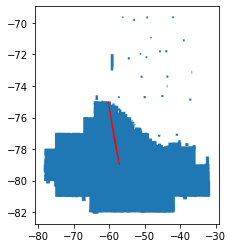

In [47]:
ax =outline.plot()
ch.plot(ax=ax,color='r')

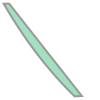

In [16]:
ch.plot('')

In [17]:
!echo $TMPDIR

/tmp//2711200.unity-1.asc.ohio-state.edu


In [18]:
y = gdf.geometry.unary_union.envelope
print(y)

POLYGON ((-60.29405695582228 -79.00604159779911, -56.89335866689649 -79.00604159779911, -56.89335866689649 -74.97437839289114, -60.29405695582228 -74.97437839289114, -60.29405695582228 -79.00604159779911))


In [19]:
x = gpd.GeoDataFrame([ch])

In [20]:
# x.hvplot(geo=True, color='strip', alpha=0.7, width=400, height=500)
type(x)

geopandas.geodataframe.GeoDataFrame

## Tiles from PGC

In [4]:
tile = gpd.read_file('/fs/project/howat.4/icesat2/antarctica_ATL06/REMA_Tile_Index/REMA_Tile_Index_Rel1_1.shp')
print(len(tile))
tile.head()

1516


,name,tile,nd_value,resolution,creationda,raster,fileurl,spec_type,qual,reg_src,num_gcps,meanresz,active,qc,rel_ver,num_comp,st_area_sh,st_length_,geometry
0,34_23_8m,34_23,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,0,0.0,1,2,1.1,9,1.000000e+10,400000.0,"POLYGON ((-800000.000 400000.000, -700000.000 ..."
1,30_14_8m,30_14,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,0,0.0,1,2,1.1,39,1.000000e+10,400000.0,"POLYGON ((-1700000.000 0.000, -1600000.000 0.0..."
2,11_40_8m,11_40,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,0,0.0,1,2,1.1,30,1.000000e+10,400000.0,"POLYGON ((900000.000 -1900000.000, 1000000.000..."
3,32_18_8m,32_18,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,0,0.0,1,2,1.1,47,1.000000e+10,400000.0,"POLYGON ((-1300000.000 200000.000, -1200000.00..."
4,33_14_8m,33_14,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,0,0.0,1,2,1.1,36,1.000000e+10,400000.0,"POLYGON ((-1700000.000 300000.000, -1600000.00..."


In [5]:
tile['row'] = tile.name.apply(lambda x: x[:2])
tile['col'] = tile.name.apply(lambda x: x[4:6])
# tile['res'] = tile.name.apply(lambda x: x[6:]) #All values same '8m'; not required

In [6]:
# tile.crs
tile_names = list(tile.name) #they are unique

In [10]:
tile_names[1]

'30_14_8m'

In [7]:
len(tile), len(tile_names)

(1516, 1516)

In [8]:
len(tile.col.unique()), len(tile.row.unique())

(10, 45)

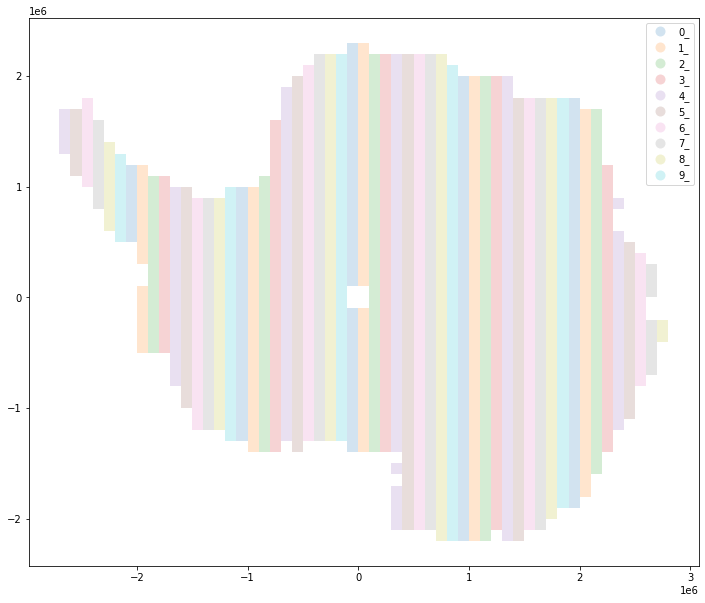

In [24]:
tile.plot(column='col', figsize=(12, 12), alpha=.2, legend=True);

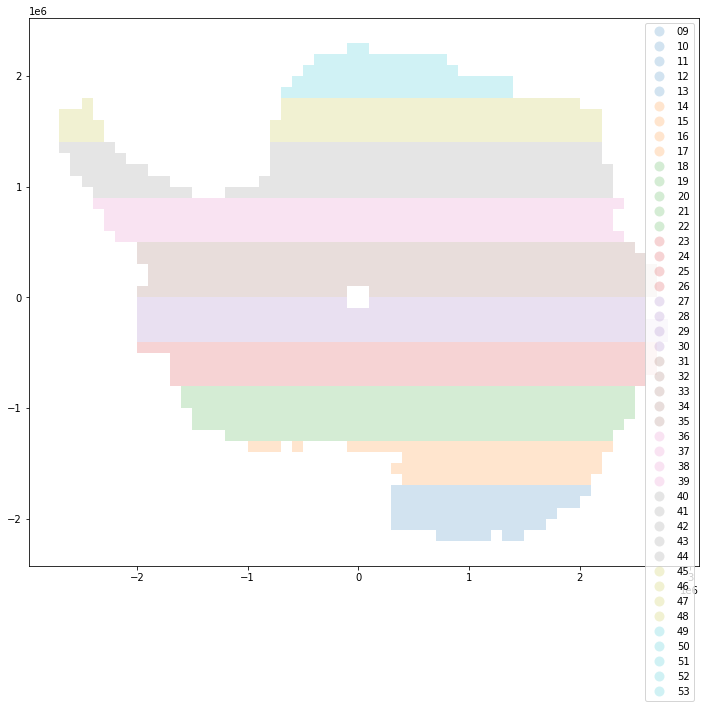

In [25]:
tile.plot(column='row', figsize=(12, 12), alpha=.2, legend=True);

In [26]:
tile.head()

,name,tile,nd_value,resolution,creationda,raster,fileurl,spec_type,qual,reg_src,...,active,qc,rel_ver,num_comp,st_area_sh,st_length_,geometry,row,col,res
0,34_23_8m,34_23,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,...,1,2,1.1,9,1.000000e+10,400000.0,"POLYGON ((-800000.000 400000.000, -700000.000 ...",34,3_,8m
1,30_14_8m,30_14,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,...,1,2,1.1,39,1.000000e+10,400000.0,"POLYGON ((-1700000.000 0.000, -1600000.000 0.0...",30,4_,8m
2,11_40_8m,11_40,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,...,1,2,1.1,30,1.000000e+10,400000.0,"POLYGON ((900000.000 -1900000.000, 1000000.000...",11,0_,8m
3,32_18_8m,32_18,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,...,1,2,1.1,47,1.000000e+10,400000.0,"POLYGON ((-1300000.000 200000.000, -1200000.00...",32,8_,8m
4,33_14_8m,33_14,-9999.0,8.0,2018-10-22,None,http://data.pgc.umn.edu/elev/dem/setsm/REMA/mo...,DEM,1.0,None,...,1,2,1.1,36,1.000000e+10,400000.0,"POLYGON ((-1700000.000 300000.000, -1600000.00...",33,4_,8m


In [44]:
# len(tile)*300/1e3 #GB of hdf data
len(tile)*300/1e3 #GB of hdf data


454.8

In [31]:
tile[tile.col==3]

In [38]:
base = gv.tile_sources.EsriImagery

In [41]:
base * tile[tile.name.isin(tile_names[:4])].to_crs('EPSG:4326').hvplot(geo=True, width=800, height=800)

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

In [3]:
short_name = 'ATL06'
icesat2_path = f'/fs/project/howat.4/icesat2/antarctica_tiles_{short_name}'
os.listdir(icesat2_path)

['tile01']

In [47]:
import time

In [48]:
time.sleep(10)
print('hello')

hello
